In [1]:
import pandas as pd
import json
from pandas import json_normalize
from IPython.display import display
import os

In [2]:
#Creation d'une fonction permettant de faire un tour rapide sur notre dataFrame
def resumetable(df):

    new_df = pd.DataFrame(columns = ["type","nb_na","nb_val","lign1","ligne2","ligne3"], index = df.columns)

    for col in df.columns:
        liste = []

        liste.append(df[col].dtype)
        liste.append(df[col].isna().sum())
        liste.append(df[col].unique().shape[0])
        liste.append(df[col].iloc[0])
        liste.append(df[col].iloc[1])
        liste.append(df[col].iloc[2])
        
        new_df.loc[col]= liste

    return new_df

In [3]:
#Ajout des différents fichiers dans une liste pour pouvoir les parcourir par la suite
directory = "./json_files"
liste_fichiers = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

In [4]:
#Creation d'un premier dataFrame de parcours pour analyser les données initiales
df2 = pd.DataFrame()

for fichier in liste_fichiers:
    with open("json_files/" + fichier, 'r') as j:
        info = json.loads(j.read())

    df2 = pd.concat([df2,json_normalize(info)])

display(df2.head(10))


,observation,label,image_id,image_url,user,date,thumbnail,location,gbif_info.kingdom,gbif_info.family,...,gbif_info.genusKey,gbif_info.canonicalName,gbif_info.phylumKey,gbif_info.class,gbif_info.synonym,gbif_info.scientificName,gbif_info.genus,gbif_info.order,gbif_info.note,gbif_info
0,1,Xylaria polymorpha,1,http://mushroomobserver.org/images/320/1,1,2006-05-21 07:17:05,1,214,Fungi,Xylariaceae,...,2568748.0,Xylaria polymorpha,95.0,Sordariomycetes,False,"Xylaria polymorpha (Pers.) Grev., 1824",Xylaria,Xylariales,NaN,NaN
1,2,Xylaria magnoliae,2,http://mushroomobserver.org/images/320/2,1,2006-05-21 07:17:06,1,53,Fungi,Xylariaceae,...,2568748.0,Xylaria magnoliae,95.0,Sordariomycetes,False,"Xylaria magnoliae J.D. Rogers, 1979",Xylaria,Xylariales,NaN,NaN
2,3,Xylaria hypoxylon,3,http://mushroomobserver.org/images/320/3,1,2006-05-21 07:17:08,1,60,Fungi,Xylariaceae,...,2568748.0,Xylaria hypoxylon,95.0,Sordariomycetes,False,"Xylaria hypoxylon (L.) Grev., 1824",Xylaria,Xylariales,NaN,NaN
3,4,Xylaria hypoxylon,4,http://mushroomobserver.org/images/320/4,1,2006-05-21 07:17:10,1,5,Fungi,Xylariaceae,...,2568748.0,Xylaria hypoxylon,95.0,Sordariomycetes,False,"Xylaria hypoxylon (L.) Grev., 1824",Xylaria,Xylariales,NaN,NaN
4,5,Xeromphalina,5,http://mushroomobserver.org/images/320/5,1,2006-05-21 07:17:12,1,36,Fungi,Mycenaceae,...,2527268.0,Xeromphalina,34.0,Agaricomycetes,False,Xeromphalina Kühner & Maire,Xeromphalina,Agaricales,NaN,NaN
5,6,Xeromphalina campanella,6,http://mushroomobserver.org/images/320/6,1,2006-05-21 07:17:13,1,58,Fungi,Mycenaceae,...,2527268.0,Xeromphalina campanella,34.0,Agaricomycetes,False,Xeromphalina campanella (Batsch) Kühner & Mair...,Xeromphalina,Agaricales,NaN,NaN
6,7,Xerocomellus zelleri,7,http://mushroomobserver.org/images/320/7,1,2006-05-21 07:17:14,1,58,Fungi,Boletaceae,...,8184844.0,Xerocomellus zelleri,34.0,Agaricomycetes,False,"Xerocomellus zelleri (Murrill) Klofac, 2011",Xerocomellus,Boletales,NaN,NaN
7,8,Xerocomellus zelleri,8,http://mushroomobserver.org/images/320/8,1,2006-05-21 07:17:15,1,39,Fungi,Boletaceae,...,8184844.0,Xerocomellus zelleri,34.0,Agaricomycetes,False,"Xerocomellus zelleri (Murrill) Klofac, 2011",Xerocomellus,Boletales,NaN,NaN
8,9,Xerocomus subtomentosus,9,http://mushroomobserver.org/images/320/9,1,2006-05-21 07:17:17,1,69,Fungi,Boletaceae,...,2519224.0,Xerocomus subtomentosus,34.0,Agaricomycetes,False,Xerocomus subtomentosus,Xerocomus,Boletales,NaN,NaN
9,9,Xerocomus subtomentosus,10,http://mushroomobserver.org/images/320/10,1,2006-05-21 07:17:17,0,69,Fungi,Boletaceae,...,2519224.0,Xerocomus subtomentosus,34.0,Agaricomycetes,False,Xerocomus subtomentosus,Xerocomus,Boletales,NaN,NaN


In [5]:
#Changement du nom des colonnes
new_cols = {}
for col in df2.columns:
    new_cols[col] = col.replace('gbif_info.','')

In [6]:
#Import de librairies de visualisation
import matplotlib.pyplot as plt
import seaborn as sns

C:\Users\matti\AppData\Local\Temp\ipykernel_4976\413602929.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x=repartition_thumbnail.index, y=repartition_thumbnail.values, palette = 'viridis')


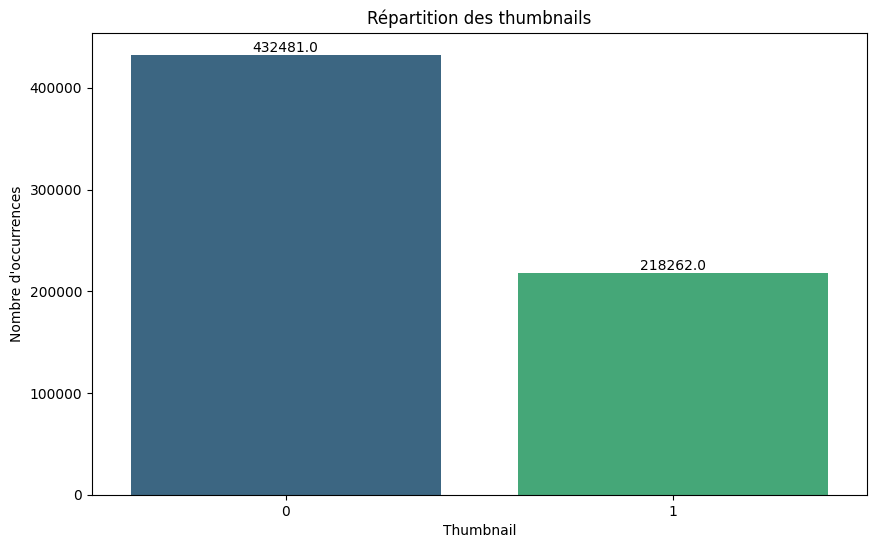

In [7]:
#Creation d'un nouveau dataFrame avec les nouveaux noms de colonne
new_df = df2.rename(columns=new_cols)
repartition_thumbnail = new_df['thumbnail'].value_counts()

#Creation d'un graphique montrant la répartition de notre dataFrame par "thumbnails"
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=repartition_thumbnail.index, y=repartition_thumbnail.values, palette = 'viridis')
plt.title('Répartition des thumbnails')
plt.xlabel('Thumbnail')
plt.ylabel('Nombre d\'occurrences')

for p in ax.patches:
    ax.annotate(f"{p.get_height()}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.show()

#On Créer un nouveau dataFrame prenant en compte uniquement les lignes avec un thumbnail = 1 
new_df = new_df[new_df['thumbnail']==1]

In [8]:
#Exploration des informations de notre DataFrame
display(resumetable(new_df))
display(new_df.describe())

,type,nb_na,nb_val,lign1,ligne2,ligne3
observation,object,0,218259,1,2,3
label,object,0,12013,Xylaria polymorpha,Xylaria magnoliae,Xylaria hypoxylon
image_id,object,0,217977,1,2,3
image_url,object,0,217969,http://mushroomobserver.org/images/320/1,http://mushroomobserver.org/images/320/2,http://mushroomobserver.org/images/320/3
user,object,0,3637,1,1,1
date,object,0,208477,2006-05-21 07:17:05,2006-05-21 07:17:06,2006-05-21 07:17:08
thumbnail,int64,0,1,1,1,1
location,object,13,14324,214,53,60
kingdom,object,11276,8,Fungi,Fungi,Fungi
family,object,21931,457,Xylariaceae,Xylariaceae,Xylariaceae


,thumbnail,speciesKey,orderKey,confidence,classKey,familyKey,usageKey,kingdomKey,genusKey,phylumKey,gbif_info
count,218262.0,1.388230e+05,2.040020e+05,218215.000000,2.047410e+05,1.963310e+05,2.069950e+05,206986.000000,1.934500e+05,2.056080e+05,0.0
mean,1.0,4.501330e+06,2.922860e+04,96.723983,1.287443e+04,1.410750e+05,3.889303e+06,5.012783,3.584471e+06,1.091782e+04,NaN
std,0.0,2.067711e+06,4.489083e+05,2.188141,3.069333e+05,7.785914e+05,2.221266e+06,0.399846,2.075097e+06,2.893861e+05,NaN
min,1.0,1.309692e+06,3.720000e+02,84.000000,1.250000e+02,1.958000e+03,5.000000e+00,0.000000,1.309629e+06,9.000000e+00,NaN
25%,1.0,2.543322e+06,1.144000e+03,94.000000,1.860000e+02,4.172000e+03,2.527866e+06,5.000000,2.524961e+06,3.400000e+01,NaN
50%,1.0,3.360287e+06,1.499000e+03,98.000000,1.860000e+02,4.186000e+03,2.593405e+06,5.000000,2.529999e+06,3.400000e+01,NaN
75%,1.0,5.455910e+06,1.499000e+03,98.000000,1.860000e+02,8.442000e+03,5.255104e+06,5.000000,2.601137e+06,3.400000e+01,NaN
max,1.0,8.708587e+06,8.285979e+06,100.000000,8.179345e+06,8.428462e+06,8.708587e+06,7.000000,8.703561e+06,8.158183e+06,NaN


Text(0.5, 1.0, 'Répartition des champignons par Phylum')

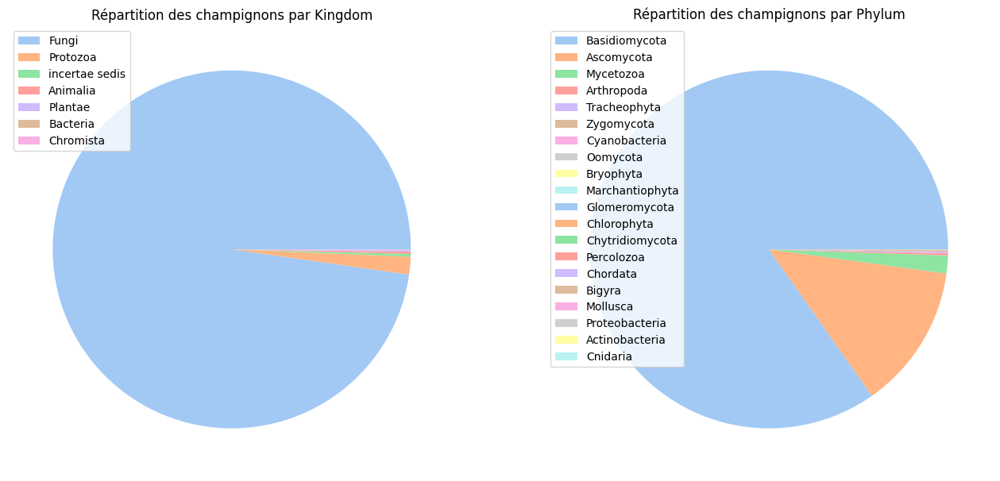

In [9]:
#On créer des graphiques permettant d'avoir une répartition des champignons par kingdom et phylum
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(16,8))

#Partie Kingdom
colors = sns.color_palette("pastel")
ax1.pie(pd.DataFrame(new_df['kingdom'].value_counts()).reset_index()['count'], colors=colors);
ax1.legend(pd.DataFrame(new_df['kingdom'].value_counts()).reset_index()['kingdom'], loc="upper left")
ax1.set_title("Répartition des champignons par Kingdom")

#Partie Phylum
colors = sns.color_palette("pastel")
ax2.pie(pd.DataFrame(new_df['phylum'].value_counts()).reset_index()['count'], colors=colors);
ax2.legend(pd.DataFrame(new_df['phylum'].value_counts()).reset_index()['phylum'], loc="upper left")
ax2.set_title("Répartition des champignons par Phylum")

#Nous avons une valeur qui ressort par rapport aux autre à chaque fois

In [10]:
#On ne peut pas faire de piechart (camembert) pour les classes car nous avons beaucoup trop de classes différentes
class_counts = new_df['class'].value_counts()
class_percentages = (class_counts / class_counts.sum() * 100).round(2)
class_counts_df = pd.DataFrame({'Count': class_counts.values}, index=class_counts.index)
class_counts_df['Percentage'] = class_percentages.values
display(class_counts_df.T)

class,Agaricomycetes,Lecanoromycetes,Pezizomycetes,Sordariomycetes,Myxomycetes,Leotiomycetes,Dacrymycetes,Tremellomycetes,Eurotiomycetes,Arthoniomycetes,...,Gastropoda,Gammaproteobacteria,Polypodiopsida,Equisetopsida,Malasseziomycetes,Dictyosteliomycetes,Trebouxiophyceae,Bryopsida,Jungermanniopsida,Hydrozoa
Count,172008.00,11379.00,6519.00,5035.00,2641.00,2105.00,1032.0,703.00,444.00,376.00,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Percentage,84.01,5.56,3.18,2.46,1.29,1.03,0.5,0.34,0.22,0.18,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


C:\Users\matti\AppData\Local\Temp\ipykernel_4976\625815060.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\matti\AppData\Local\Temp\ipykernel_4976\625815060.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\matti\AppData\Local\Temp\ipykernel_4976\625815060.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\matti\AppData\Local\Temp\ipykernel_4976\625815060.py:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels

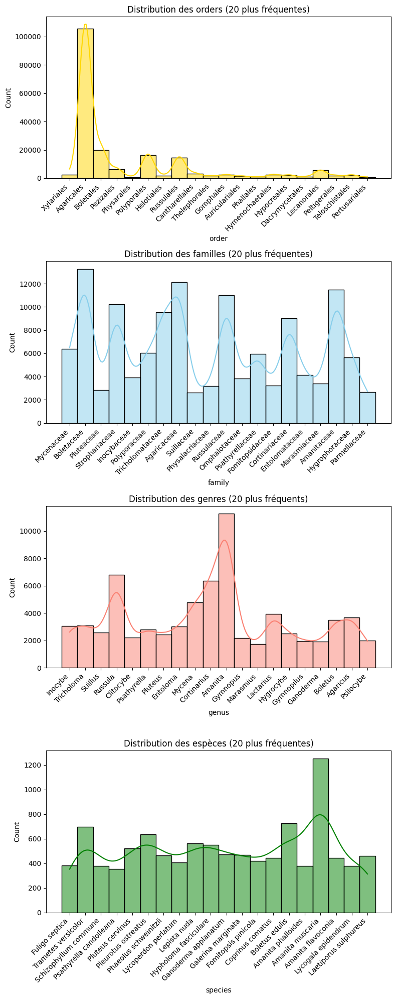

In [11]:
########Affichage des 20 meilleurs##############
# Triez les données selon les comptages
orders_counts = new_df['order'].value_counts().nlargest(20)
family_counts = new_df['family'].value_counts().nlargest(20)
genus_counts = new_df['genus'].value_counts().nlargest(20)
species_counts = new_df['species'].value_counts().nlargest(20)

# Créez une figure avec trois sous-graphiques
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(8, 20))

# Tracer les histplots avec les données triées
sns.histplot(new_df[new_df['order'].isin(orders_counts.index)], x='order', ax=ax1, color='gold', kde=True);
sns.histplot(new_df[new_df['family'].isin(family_counts.index)], x='family', ax=ax2, color='skyblue', kde=True);
sns.histplot(new_df[new_df['genus'].isin(genus_counts.index)], x='genus', ax=ax3, color='salmon', kde=True);
sns.histplot(new_df[new_df['species'].isin(species_counts.index)], x='species', ax=ax4, color='green', kde=True);

# Définir les titres des graphiques
ax1.set_title('Distribution des orders (20 plus fréquentes)')
ax2.set_title('Distribution des familles (20 plus fréquentes)')
ax3.set_title('Distribution des genres (20 plus fréquents)')
ax4.set_title('Distribution des espèces (20 plus fréquentes)')

# Tourner les labels des valeurs sur l'axe x
for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

C:\Users\matti\AppData\Local\Temp\ipykernel_4976\2676451822.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\matti\AppData\Local\Temp\ipykernel_4976\2676451822.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\matti\AppData\Local\Temp\ipykernel_4976\2676451822.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\matti\AppData\Local\Temp\ipykernel_4976\2676451822.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xtickla

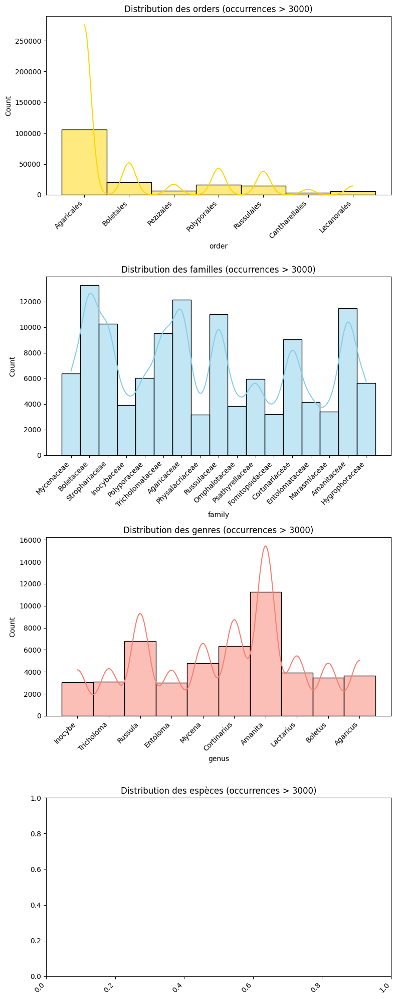

In [12]:
############Affichage des +3000 occurrences#############
# Filtrer les données pour inclure uniquement les labels avec plus de 3000 occurrences
filtered_order = new_df['order'].value_counts()[new_df['order'].value_counts() > 3000].index
filtered_family = new_df['family'].value_counts()[new_df['family'].value_counts() > 3000].index
filtered_genus = new_df['genus'].value_counts()[new_df['genus'].value_counts() > 3000].index
filtered_species = new_df['species'].value_counts()[new_df['species'].value_counts() > 3000].index

# Créer un sous-ensemble de données contenant uniquement ces labels filtrés
filtered_df_order = new_df[new_df['order'].isin(filtered_order)]
filtered_df_family = new_df[new_df['family'].isin(filtered_family)]
filtered_df_genus = new_df[new_df['genus'].isin(filtered_genus)]
filtered_df_species = new_df[new_df['species'].isin(filtered_species)]

# Créer la figure et les sous-graphiques
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(8, 20))

# Tracer les histogrammes avec les données filtrées
sns.histplot(filtered_df_order['order'], ax=ax1, color='gold', kde=True);
sns.histplot(filtered_df_family['family'], ax=ax2, color='skyblue', kde=True);
sns.histplot(filtered_df_genus['genus'], ax=ax3, color='salmon', kde=True);
sns.histplot(filtered_df_species['species'], ax=ax4, color='green', kde=True);

# Définir les titres des sous-graphiques
ax1.set_title('Distribution des orders (occurrences > 3000)')
ax2.set_title('Distribution des familles (occurrences > 3000)')
ax3.set_title('Distribution des genres (occurrences > 3000)')
ax4.set_title('Distribution des espèces (occurrences > 3000)')

# Tourner les labels des valeurs sur l'axe x
for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

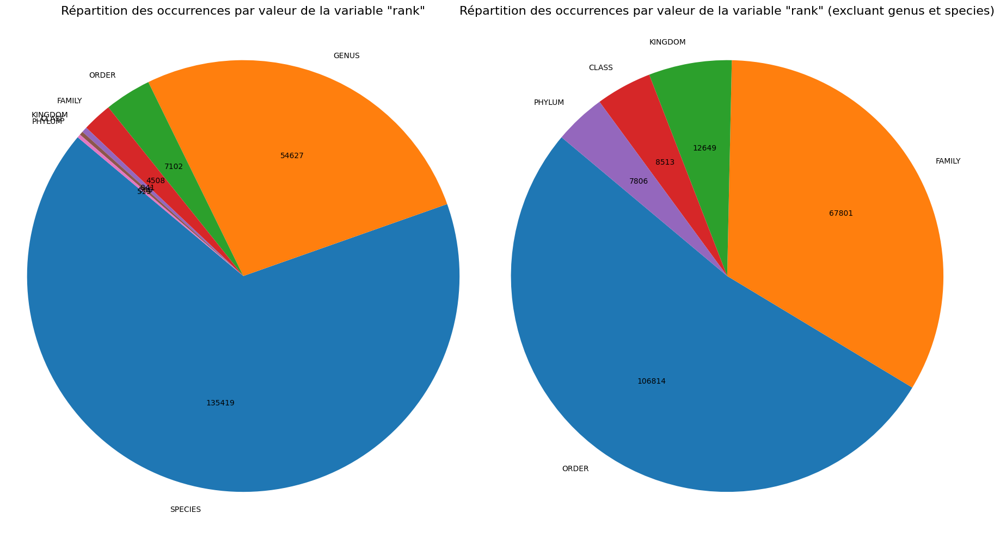

In [13]:
#Fonction pour formatter le texte à afficher sur les tranches du camembert
def formatter(pct):
    total = sum(occurrences_all)
    val = int(round(pct*total/100.0))
    return '{:d}'.format(val)

# Créer la figure et les sous-graphiques
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))

# Premier camembert : toutes les valeurs de 'rank'
occurrences_all = new_df[(new_df['rank'] != 'VARIETY') & (new_df['rank'] != 'FORM')& (new_df['rank'] != 'SUBSPECIES')]['rank'].value_counts()
ax1.pie(occurrences_all, labels=occurrences_all.index, autopct=formatter, startangle=140)
ax1.set_title('Répartition des occurrences par valeur de la variable "rank"',  fontsize=16)

# Deuxième camembert : valeurs de 'rank' excluant 'genus' et 'species'
filtered_df = new_df[(new_df['rank'] != 'GENUS') & (new_df['rank'] != 'SPECIES') & 
                     (new_df['rank'] != 'VARIETY') & (new_df['rank'] != 'FORM')
                      & (new_df['rank'] != 'SUBSPECIES')]
occurrences_filtered = filtered_df['rank'].value_counts()
ax2.pie(occurrences_filtered, labels=occurrences_filtered.index, autopct=formatter, startangle=140)
ax2.set_title('Répartition des occurrences par valeur de la variable "rank" (excluant genus et species)', fontsize=16)

# Assure que les camemberts sont circulaires
ax1.axis('equal')
ax2.axis('equal')

# Afficher les graphiques
plt.tight_layout()
plt.show()

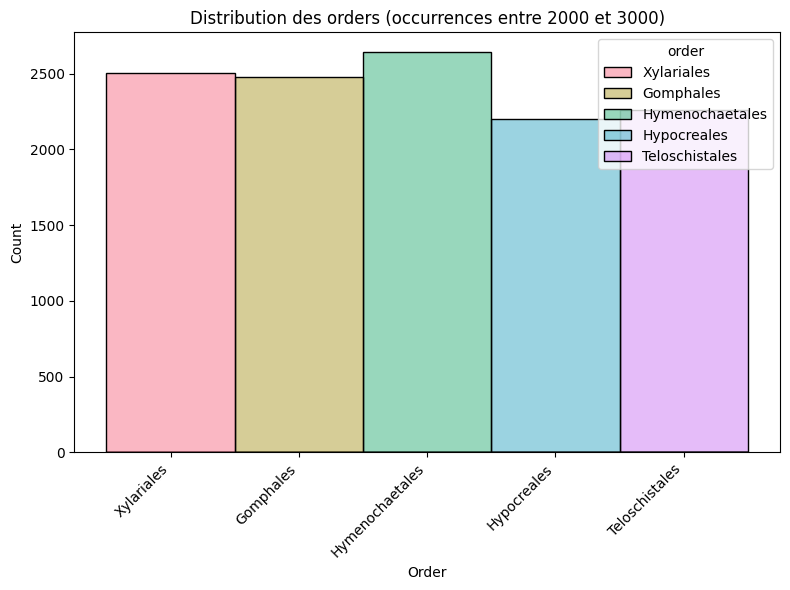

In [14]:
############Affichage odrder avec entre 2000 et 3000 occurences############
# Filtrer les données pour inclure uniquement les labels avec 2000 à 3000 occurrences
filtered_order = new_df['order'].value_counts()[(new_df['order'].value_counts() <= 3000) & (new_df['order'].value_counts() >= 2000)].index
 
# Créer un sous-ensemble de données contenant uniquement ces labels filtrés
filtered_df_order = new_df[new_df['order'].isin(filtered_order)]
 
# Créer la figure et les sous-graphiques
plt.figure(figsize=(8, 6))
 
# Tracer les histogrammes avec les données filtrées
sns.histplot(filtered_df_order, x = 'order', kde=True,
             palette = sns.color_palette("husl", len(filtered_order)),
             hue = 'order')
 
# Définir les titres des sous-graphiques
plt.title('Distribution des orders (occurrences entre 2000 et 3000)')
plt.xlabel('Order')
plt.ylabel('Count')
 
plt.xticks(rotation=45, ha='right')
 
plt.tight_layout()
plt.show()

In [15]:
##############Dataset qui ne garde que les variables qui nous interesse#################
#Sélection des orders entre 2000 et 3000
order_range = new_df[new_df['order'].isin(['Xylariales','Gomphales','Hymenochaetales','Hypocreales','Teloschistales'])]

#Filtre sur les variables
order_df = order_range[['image_id','image_url','date','orderKey', 'order']]
#On decide de garder des id unique donc on enlève les doublons
order_df = order_df.drop_duplicates('image_id')
#Nombre de lignes total
print("Taille du dataFrame : "+str(order_df.shape[0]))

Taille du dataFrame : 12052


In [16]:
#On créer un nouveau dataframe avec les n premières lignes par Order
head_size = 2000
df_Xy = order_df[order_df.order == 'Xylariales'].head(head_size)
df_Hyp = order_df[order_df.order == 'Hypocreales'].head(head_size)
df_Hym = order_df[order_df.order == 'Hymenochaetales'].head(head_size)
df_Gom = order_df[order_df.order == 'Gomphales'].head(head_size)
df_Te = order_df[order_df.order == 'Teloschistales'].head(head_size)
order_df_test = pd.concat([df_Xy,df_Hyp,df_Hym,df_Gom,df_Te], axis=0)

In [17]:
#################### ON AJOUTE TOUTES LES PHOTOS DU DF DANS UN FICHIER#########################
#Partie téléchargment des photos en focntion des id dans notre dataframe
#Cette partie est longue si les photos correspondantes ne sont pas déjà présentes dans notre fichier

import requests
import shutil
import pandas as pd
import sys
from pathlib import Path
 
ind = 1

#Boucle de parcours du dataFrame
for index, row in order_df_test.iterrows():
    ind += 1
    #Ecrire l'URL qui sera telechargeable
    url_tel ="https://images.mushroomobserver.org/" +  row['image_url'].split("/")[-2] + "/" + row['image_url'].split("/")[-1]  + ".jpg"
    
    #Création du chemin d'accès à l'image
    filename = "./images/" + row['image_url'].split("/")[-1] + ".jpg"
 
 
    if Path(filename).is_file() == False:
        # Open the url image, set stream to True, this will return the stream content.
        r = requests.get(url_tel, stream = True, verify=False)
 
        # Check if the image was retrieved successfully
        if r.status_code == 200:
            # Set decode_content value to True, otherwise the downloaded image file's size will be zero.
            r.raw.decode_content = True
           
            # Open a local file with wb ( write binary ) permission.
            with open(filename,'wb') as f:
                shutil.copyfileobj(r.raw, f)


In [18]:
###################### ON PARCOURT LE FICHIER DES PHOTOS POUR LES AJOUTER AU DF #########################################
from os import listdir
from os.path import isfile, join
from PIL import Image

#Creation d'une liste de chemin d'accès aux images avec les id présents dans notre DataFrame
path = './images/'
listFiles = []
for f in order_df_test['image_id']:
  listFiles.append(str(f) + ".jpg")

#Ajout de toutes les images dans des listes r
imgs = []
imgs_gray = []
for filename in listFiles:
    temp = Image.open(path + str(filename))
    keep = temp.copy()
    imgs.append(keep)
    temp.close()
    temp = Image.open(path + str(filename)).convert('L')
    keep = temp.copy()
    imgs_gray.append(keep)
    temp.close()


# Appliquer la fonction pour ouvrir chaque image et stocker les résultats dans une nouvelle colonne
order_df_test['image_visuelle'] = imgs
order_df_test['image_gris'] = imgs_gray


In [19]:
########################### METTRE LES IMAGES EN ARRAY #########################
import numpy as np

# Fonction pour convertir une image PIL en tableau numpy
def image_to_array(image):
    return np.array(image)

# Appliquer la fonction pour convertir chaque image et stocker les résultats dans une nouvelle colonne
order_df_test['image_array'] = order_df_test['image_visuelle'].apply(image_to_array)
order_df_test['image_array_gris'] = order_df_test['image_gris'].apply(image_to_array)

display(order_df_test.head(10))


,image_id,image_url,date,orderKey,order,image_visuelle,image_gris,image_array,image_array_gris
0,1,http://mushroomobserver.org/images/320/1,2006-05-21 07:17:05,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x240 a...,<PIL.Image.Image image mode=L size=320x240 at ...,"[[[117, 99, 111], [118, 101, 109], [119, 103, ...","[[106, 107, 108, 106, 98, 88, 80, 76, 60, 72, ..."
1,2,http://mushroomobserver.org/images/320/2,2006-05-21 07:17:06,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x240 a...,<PIL.Image.Image image mode=L size=320x240 at ...,"[[[18, 9, 10], [18, 9, 10], [19, 11, 9], [19, ...","[[12, 12, 13, 13, 13, 13, 14, 14, 15, 15, 15, ..."
2,3,http://mushroomobserver.org/images/320/3,2006-05-21 07:17:08,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x240 a...,<PIL.Image.Image image mode=L size=320x240 at ...,"[[[87, 57, 57], [92, 62, 64], [97, 68, 70], [1...","[[66, 71, 77, 81, 84, 90, 97, 101, 102, 102, 1..."
3,4,http://mushroomobserver.org/images/320/4,2006-05-21 07:17:10,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=240x320 a...,<PIL.Image.Image image mode=L size=240x320 at ...,"[[[6, 5, 1], [6, 5, 1], [7, 6, 2], [8, 7, 3], ...","[[5, 5, 6, 7, 8, 9, 9, 10, 9, 9, 9, 9, 9, 9, 9..."
988,983,http://mushroomobserver.org/images/320/983,2006-10-15 19:52:50,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x240 a...,<PIL.Image.Image image mode=L size=320x240 at ...,"[[[229, 223, 223], [228, 222, 222], [227, 221,...","[[225, 224, 223, 223, 223, 224, 225, 226, 224,..."
1079,1078,http://mushroomobserver.org/images/320/1078,2006-11-05 04:16:33,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x240 a...,<PIL.Image.Image image mode=L size=320x240 at ...,"[[[86, 91, 69], [86, 91, 69], [85, 90, 68], [8...","[[87, 87, 86, 86, 87, 88, 90, 91, 89, 90, 90, ..."
1298,1282,http://mushroomobserver.org/images/320/1282,2006-11-24 06:49:50,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x240 a...,<PIL.Image.Image image mode=L size=320x240 at ...,"[[[107, 138, 60], [103, 134, 56], [98, 131, 50...","[[120, 116, 112, 112, 114, 114, 111, 108, 111,..."
1361,1361,http://mushroomobserver.org/images/320/1361,2006-11-27 04:13:09,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x172 a...,<PIL.Image.Image image mode=L size=320x172 at ...,"[[[47, 32, 25], [109, 93, 78], [138, 122, 96],...","[[36, 96, 124, 131, 141, 101, 39, 22, 10, 25, ..."
1412,1385,http://mushroomobserver.org/images/320/1385,2006-11-29 06:20:48,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=240x320 a...,<PIL.Image.Image image mode=L size=240x320 at ...,"[[[97, 87, 96], [95, 85, 94], [97, 85, 97], [1...","[[91, 89, 90, 94, 93, 87, 83, 82, 96, 88, 85, ..."
2224,2296,http://mushroomobserver.org/images/320/2296,2007-01-05 17:06:36,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x246 a...,<PIL.Image.Image image mode=L size=320x246 at ...,"[[[95, 101, 87], [56, 63, 47], [59, 61, 47], [...","[[98, 59, 59, 61, 62, 54, 64, 49, 55, 52, 59, ..."


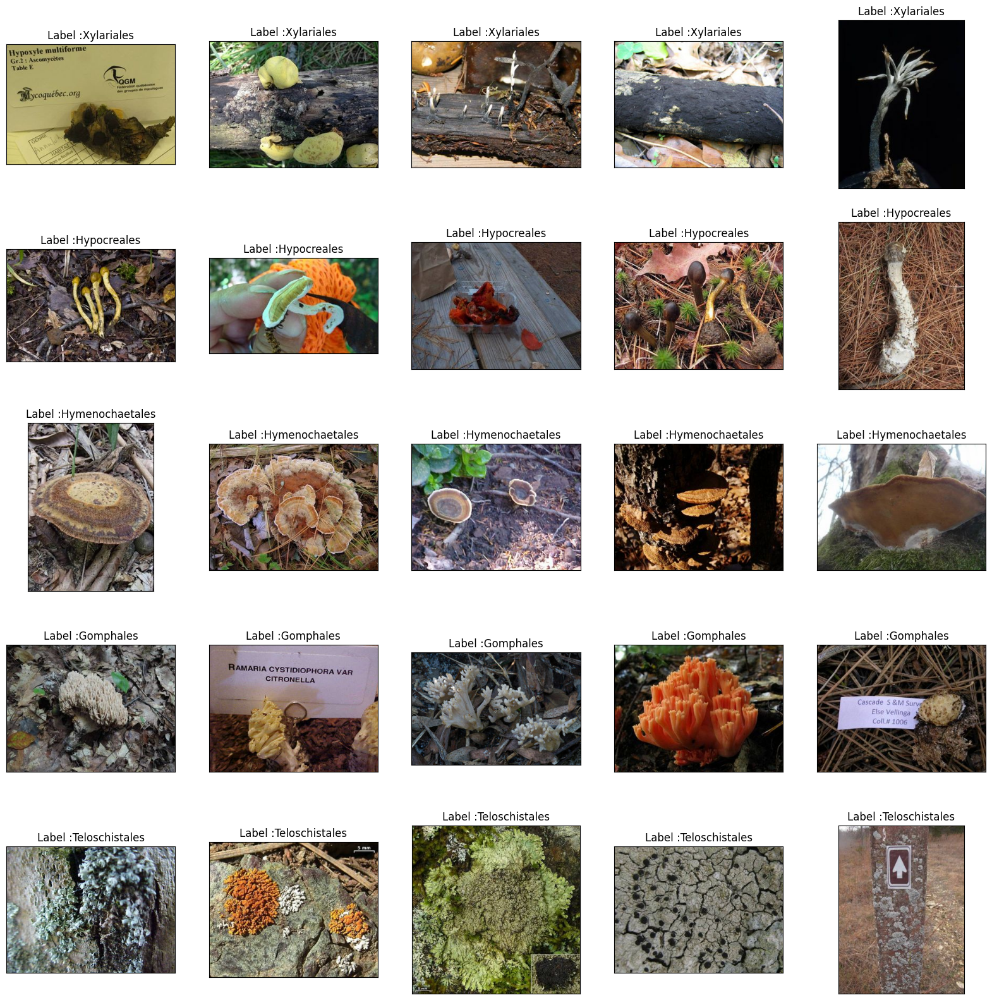

In [20]:
############## MONTRER LES 10 PREMIERES IMAGES DE CHAQUE ORDER POUR VOIR A L'OEIL NU ################
from random import randint
from matplotlib import cm

nb_col = 5 
nb_ligne = 5
j = 1
orders = order_df_test['order'].unique()

#Affichage des images
plt.figure(figsize=(20,20))
for i in range(len(orders)):
    df = order_df_test[order_df_test.order == orders[i]]
    for y in range(nb_col):
        nb = randint(0,len(df)-1)
        sample0 = df.iloc[nb]['image_array']
        plt.subplot(nb_ligne,nb_col,j)
        j+=1
        plt.xticks([])
        plt.yticks([])
        plt.imshow(sample0,cmap=cm.binary,interpolation=None)
        plt.title(f"Label :{orders[i]}")
        

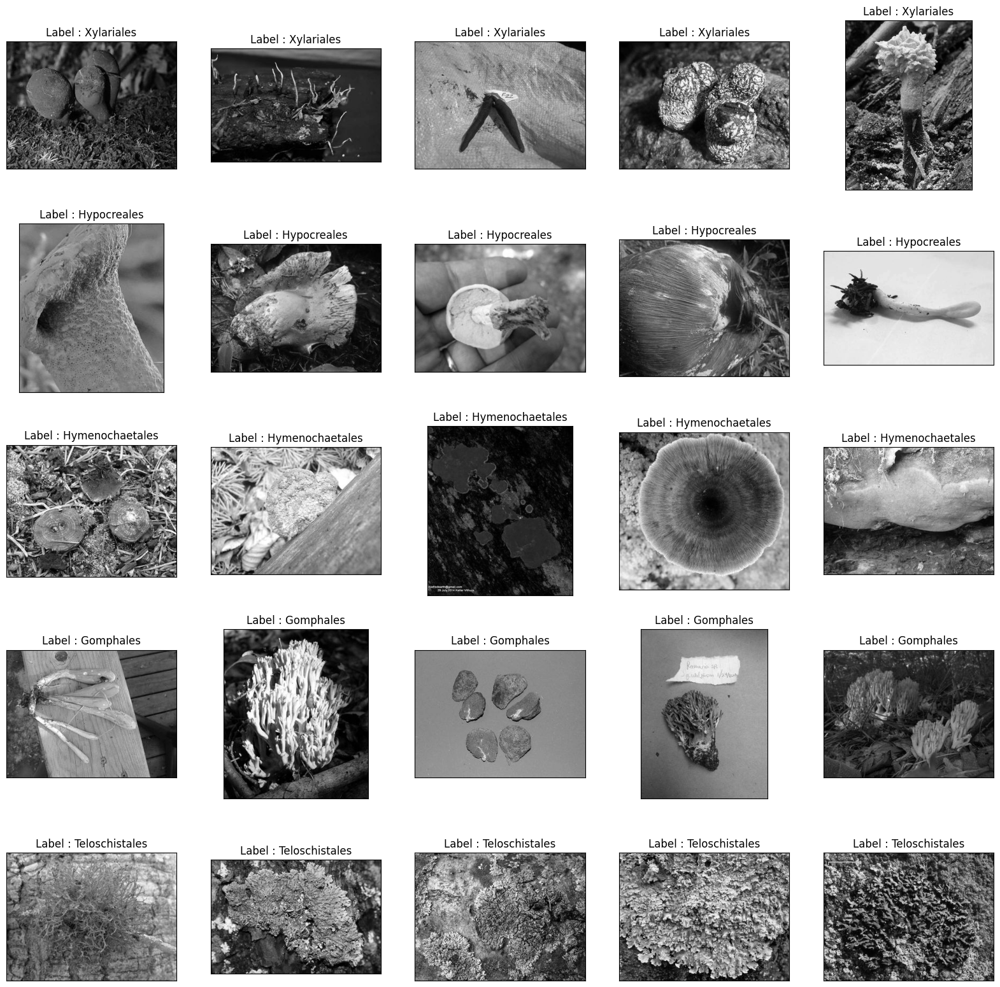

In [21]:
import cv2
 
nb_col = 5
nb_ligne = 5
j = 1
orders = order_df_test['order'].unique()

#Affichage des images en nuances de gris
plt.figure(figsize=(20,20))
for i in range(len(orders)):
    df = order_df_test[order_df_test.order == orders[i]]
    for y in range(nb_col):
        nb = randint(0,len(df)-1)
        sample0 = df.iloc[nb]['image_array_gris']
        plt.subplot(nb_ligne,nb_col,j)
        j+=1
        plt.xticks([])
        plt.yticks([])
        plt.imshow(sample0,cmap='gray',interpolation=None)
        plt.title(f"Label : {orders[i]}")

In [22]:
####################ANALYSE DE LA LUMINOSITE ET CONTRASTE DES IAMGES#######################
def luminosite(image):
    return cv2.mean(image)[0]

order_df_test['luminosite'] = order_df_test['image_array_gris'].apply(luminosite)

def nettete(image):
    edges = cv2.Canny(image, 100, 200)
    total_contour_pixels = cv2.countNonZero(edges)
    return total_contour_pixels

order_df_test['nettete'] = order_df_test['image_array_gris'].apply(nettete)

display(order_df_test.head(5))

,image_id,image_url,date,orderKey,order,image_visuelle,image_gris,image_array,image_array_gris,luminosite,nettete
0,1,http://mushroomobserver.org/images/320/1,2006-05-21 07:17:05,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x240 a...,<PIL.Image.Image image mode=L size=320x240 at ...,"[[[117, 99, 111], [118, 101, 109], [119, 103, ...","[[106, 107, 108, 106, 98, 88, 80, 76, 60, 72, ...",73.833294,16393
1,2,http://mushroomobserver.org/images/320/2,2006-05-21 07:17:06,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x240 a...,<PIL.Image.Image image mode=L size=320x240 at ...,"[[[18, 9, 10], [18, 9, 10], [19, 11, 9], [19, ...","[[12, 12, 13, 13, 13, 13, 14, 14, 15, 15, 15, ...",66.206289,4078
2,3,http://mushroomobserver.org/images/320/3,2006-05-21 07:17:08,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x240 a...,<PIL.Image.Image image mode=L size=320x240 at ...,"[[[87, 57, 57], [92, 62, 64], [97, 68, 70], [1...","[[66, 71, 77, 81, 84, 90, 97, 101, 102, 102, 1...",72.844128,16893
3,4,http://mushroomobserver.org/images/320/4,2006-05-21 07:17:10,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=240x320 a...,<PIL.Image.Image image mode=L size=240x320 at ...,"[[[6, 5, 1], [6, 5, 1], [7, 6, 2], [8, 7, 3], ...","[[5, 5, 6, 7, 8, 9, 9, 10, 9, 9, 9, 9, 9, 9, 9...",27.090013,4623
988,983,http://mushroomobserver.org/images/320/983,2006-10-15 19:52:50,1298.0,Xylariales,<PIL.Image.Image image mode=RGB size=320x240 a...,<PIL.Image.Image image mode=L size=320x240 at ...,"[[[229, 223, 223], [228, 222, 222], [227, 221,...","[[225, 224, 223, 223, 223, 224, 225, 226, 224,...",143.175560,2825


C:\Users\matti\AppData\Local\Temp\ipykernel_4976\2757215465.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=order_df_test, x='luminosite', hue='order', shade=True)


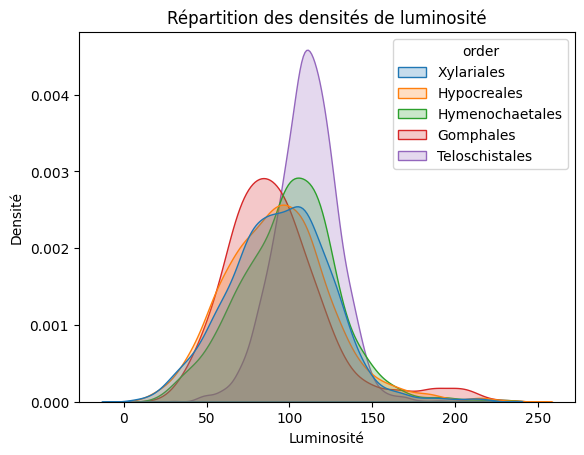

C:\Users\matti\AppData\Local\Temp\ipykernel_4976\2757215465.py:7: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=order_df_test, x='nettete', hue='order', shade=True)


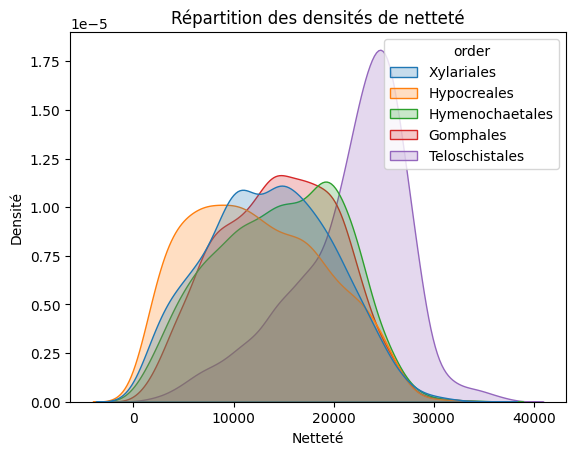

In [26]:
sns.kdeplot(data=order_df_test, x='luminosite', hue='order', shade=True)
plt.title('Répartition des densités de luminosité')
plt.xlabel('Luminosité')
plt.ylabel('Densité')
plt.show()

sns.kdeplot(data=order_df_test, x='nettete', hue='order', shade=True)
plt.title('Répartition des densités de netteté')
plt.xlabel('Netteté')
plt.ylabel('Densité')
plt.show()

In [24]:
# Calculer les statistiques descriptives pour chaque groupe
descriptive_stats_lum = order_df_test.groupby('order')['luminosite'].describe()
display(descriptive_stats_lum)
descriptive_stats_net = order_df_test.groupby('order')['nettete'].describe()
display(descriptive_stats_net)

,count,mean,std,min,25%,50%,75%,max
order,,,,,,,,
Gomphales,2000.0,92.350352,32.880349,14.831479,70.985344,88.101341,106.866822,234.231603
Hymenochaetales,2000.0,99.553517,29.730293,17.869479,80.004512,100.589310,117.737809,235.771064
Hypocreales,2000.0,92.850316,32.031632,9.488177,70.327866,92.149674,111.648164,237.786522
Teloschistales,2000.0,110.260139,18.973549,30.212747,98.505127,110.680912,122.007549,205.036156
Xylariales,2000.0,94.206791,30.548602,6.347070,74.008577,94.625184,114.224049,220.766303


,count,mean,std,min,25%,50%,75%,max
order,,,,,,,,
Gomphales,2000.0,14544.8875,5877.388215,1121.0,9968.00,14642.5,19080.00,32946.0
Hymenochaetales,2000.0,14614.4680,6307.232654,107.0,9778.00,14983.5,19648.00,34822.0
Hypocreales,2000.0,12382.8990,6667.278362,287.0,6896.00,11841.5,17500.50,33648.0
Teloschistales,2000.0,21564.8560,5801.236025,1554.0,18222.25,22891.5,25529.25,37168.0
Xylariales,2000.0,13571.5645,6257.232309,306.0,8973.00,13640.0,18176.00,34262.0


In [28]:
#Partie réduction de Dim ------>
#Taille des images
size = 128

#Focntion de réduction des pixels
def reduction(img):
    return img.resize((size,size), Image.Resampling.LANCZOS)

#Application de la réduction : 
#1- On réduit l'image d'origine (size,size)
order_df_test['image_visuelle_sized'] = order_df_test['image_visuelle'].apply(reduction)
order_df_test['image_gris_sized'] = order_df_test['image_gris'].apply(reduction)
order_df_test['image_array_gris_sized'] = order_df_test['image_gris_sized'].apply(image_to_array)

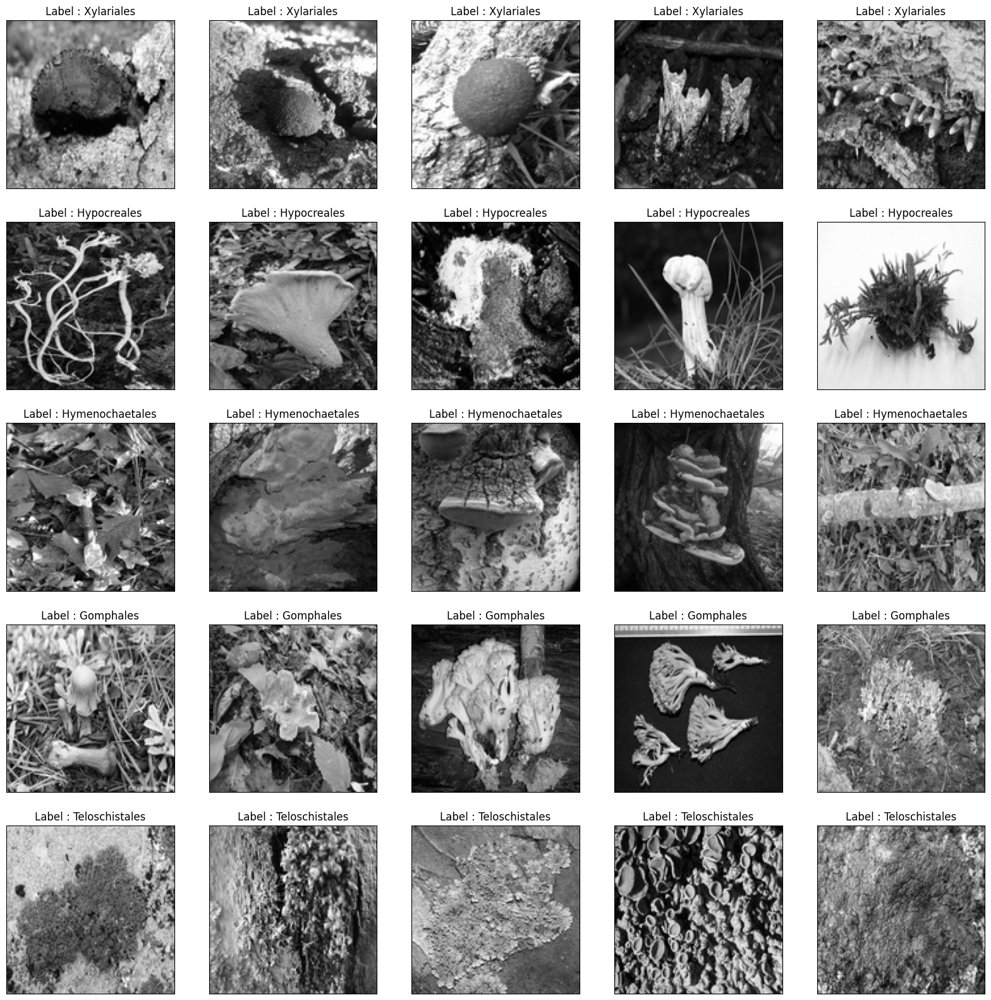

In [29]:
#On affiche les images qu'on vient de resize
nb_col = 5
nb_ligne = 5
j = 1
orders = order_df_test['order'].unique()

#Affichage des images
plt.figure(figsize=(20,20))
for i in range(len(orders)):
    df = order_df_test[order_df_test.order == orders[i]]
    for y in range(nb_col):
        nb = randint(0,len(df)-1)
        sample0 = df.iloc[nb]['image_array_gris_sized']
        plt.subplot(nb_ligne,nb_col,j)
        j+=1
        plt.xticks([])
        plt.yticks([])
        plt.imshow(sample0.reshape([size,size]),cmap='gray',interpolation=None)
        plt.title(f"Label : {orders[i]}")

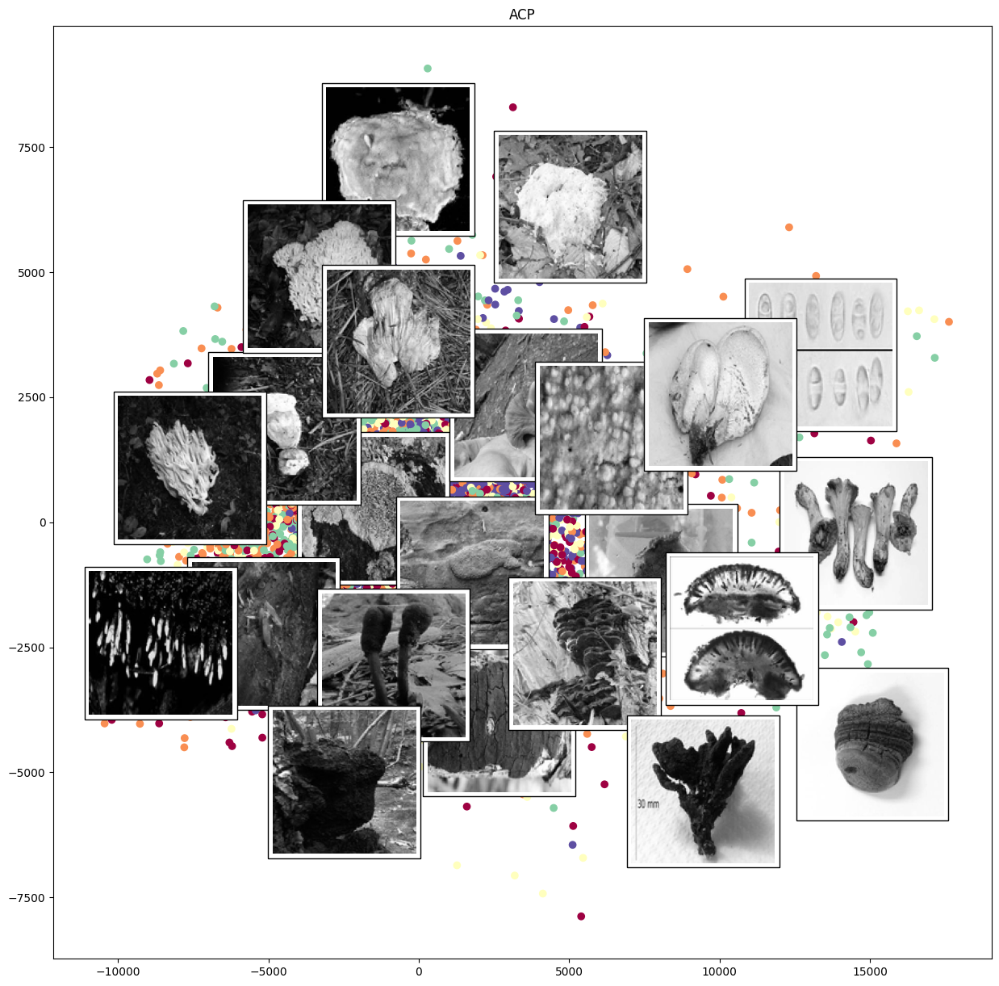

In [30]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from matplotlib import offsetbox

#ACP deux dim
images_array_base = []
lst_orders = []
for index, row in order_df_test.iterrows():
    images_array_base.append(row['image_array_gris_sized'])
    lst_orders.append(row['order'])
#On réarange nos données pour les rendre exploitables par nos modèles
flattened_images = [image.reshape(-1) for image in images_array_base]
images_array = np.vstack(flattened_images)

#On transforme notre variable explicative en données numériques (ex 'Hymenochaetales' = 1)
d = {}
idx = 1
for item in lst_orders:
    if item not in d:
        d[item] = idx
        idx+=1
res_order = [d[item] for item in lst_orders]
res_order = np.array(res_order)
res_order = res_order.reshape(-1,1)
#Split des données en données d'entrainement et de test
X_train, X_test, y_train, y_test = train_test_split(images_array, res_order, test_size=0.2, random_state=123)

#Model PCA
pca_mush = PCA(n_components=2)
mush_fit = pca_mush.fit_transform(X_train)

#Affichage de nos données sur un graphique pour avoir une réflexion visuelle aux premiers abords : 
#1- Affichage de nos données sur le graphique (sous forme de points)
fig, ax = plt.subplots(figsize=(15, 15))
plt.title("ACP")
ax = plt.gca()
ax.scatter(mush_fit[:,0],mush_fit[:,1],c=y_train,cmap=plt.get_cmap('Spectral'))

#2- Affichage des images sur notre graphique
dist_min = (.1 * max(mush_fit.max(0) - mush_fit.min(0))) ** 2
img_afficher = np.array([2*mush_fit.max(0)])
images_train = X_train.reshape((-1, size, size))
for i in range(int(X_train.shape[0] / 10)):
    dist = np.sum((mush_fit[i] - img_afficher)**2,1)
    if np.min(dist) >= dist_min :
        img_afficher = np.vstack([img_afficher, mush_fit[i]])
        imageX = offsetbox.AnnotationBbox(offsetbox.OffsetImage(images_train[i], cmap= 'gray'), mush_fit[i])
        ax.add_artist(imageX)


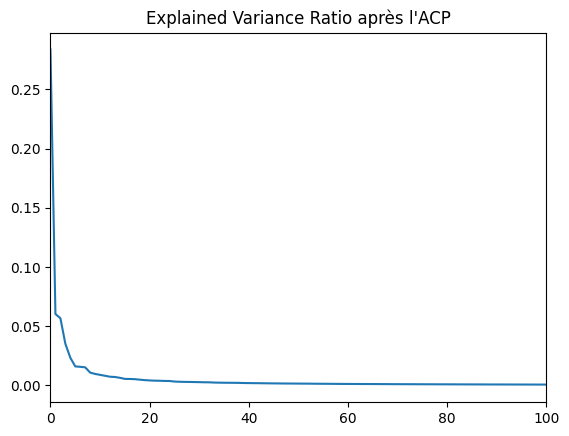

In [31]:
#Variance ratio ACP 
pca_mush2 = PCA()
pca_mush2.fit(X_train)

plt.figure()
plt.title("Explained Variance Ratio après l'ACP")
plt.xlim(0,100)
plt.plot(pca_mush2.explained_variance_ratio_)

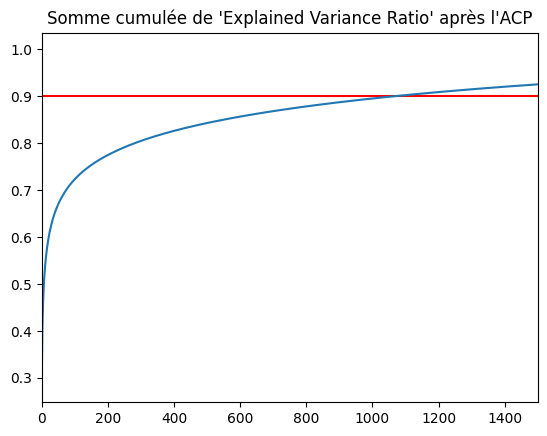

In [32]:
#On cherche a savoir si la variance expliquée est très haute sur la première composante principale
plt.figure()
plt.title("Somme cumulée de 'Explained Variance Ratio' après l'ACP")
plt.xlim(0,1500)
plt.axhline(y = 0.9, color ='r', linestyle = '-')
plt.plot(pca_mush2.explained_variance_ratio_.cumsum())

c:\Users\matti\OneDrive - LECNAM\Documents\CNAM\2A\USSI4X - NT - Entreposage et fouilles de données\vm\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


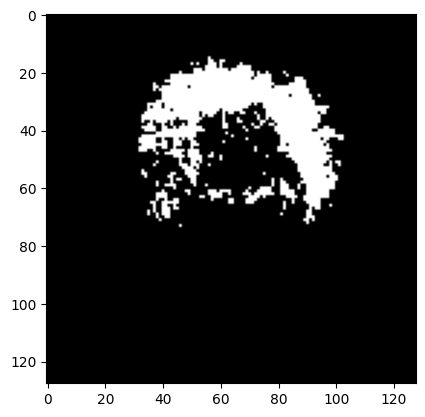

In [33]:
#Réduction de dim
from sklearn.feature_selection import SelectPercentile

sel_mush = SelectPercentile(percentile=90)
sel_mush.fit(X_train,y_train)

X_train_reduit = sel_mush.transform(X_train)
X_test_reduit = sel_mush.transform(X_test)

#Affichage des pixel portant le moins d'informations sur les images "en blanc"
plt.imshow(sel_mush.get_support().reshape(size,size), cmap='gray_r')

In [64]:
from sklearn.svm import SVC

#Application de l'ACP sur nos jeux de données réduits
pca_reduit = PCA(n_components= .9)
X_train_pca = pca_reduit.fit_transform(X_train_reduit)
X_test_pca = pca_reduit.transform(X_test_reduit)

#SVC
svc = SVC(C=1, kernel="linear")
svc.fit(X_train_pca, y_train)
#Affichage du score sur notre SVC
print(f"Score sur les données réduites (Train) : ", svc.score(X_train_pca,y_train))
print(f"Score sur les données réduites : ", svc.score(X_test_pca,y_test))

c:\Users\ELE623c5cf66e1dc\OneDrive - LECNAM\CNAM - 2nd year\entreposage_fouille_donnee\Mushroom_project\vm_mush2\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Score sur les données réduites (Train) :  1.0
Score sur les données réduites :  0.25866666666666666


In [34]:
#Fonction belle matrice
import itertools
 
def print_nice_conf_matrix(y, cnf_matrix):
    '''
    Fonction dediee a rendre une jolie matrice de confusion a partir de :
        - y : un array contenant les classes pour la classification. Sert uniquement a compter le nombre de classes.
        - cnf_matrix : la matrice de confusion qui nous interesse.
    '''
    classes = range(0,(len(np.unique(y))))
   
    plt.figure()
   
    plt.imshow(cnf_matrix, interpolation='nearest',cmap='Blues')
    plt.title("Matrice de confusion")
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)
   
    for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
        plt.text(j, i, cnf_matrix[i, j],
                 horizontalalignment = "center",
                 color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")
   
    plt.ylabel('Vrais labels')
    plt.xlabel('Labels prédits')
    plt.show()

              precision    recall  f1-score   support

           1       0.26      0.34      0.29       143
           2       0.19      0.20      0.20       162
           3       0.25      0.27      0.26       132
           4       0.29      0.25      0.27       163
           5       0.33      0.25      0.28       150

    accuracy                           0.26       750
   macro avg       0.26      0.26      0.26       750
weighted avg       0.26      0.26      0.26       750



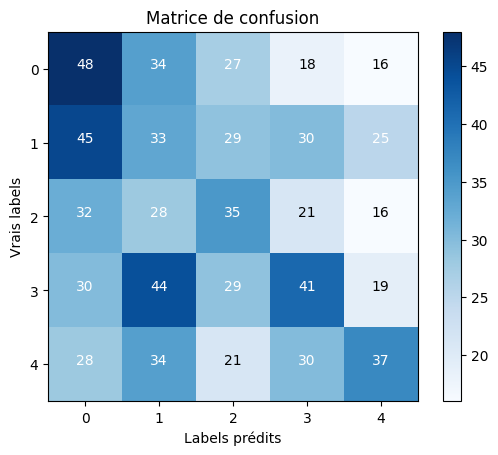

In [66]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

#Prediction des données + classificatyion report
y_pred_svc = svc.predict(X_test_pca)
print(classification_report(y_test,y_pred_svc))

#Matrice de confusion
cnf_matrix_svc = confusion_matrix(y_test,y_pred_svc)
print_nice_conf_matrix(y_test,cnf_matrix_svc)


c:\Users\ELE623c5cf66e1dc\OneDrive - LECNAM\CNAM - 2nd year\entreposage_fouille_donnee\Mushroom_project\vm_mush2\Lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
180 fits failed out of a total of 540.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
68 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\ELE623c5cf66e1dc\OneDrive - LECNAM\CNAM - 2nd year\entreposage_fouille_donnee\Mushroom_project\vm_mush2\Lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\ELE623c5cf66e1dc\OneDrive - LECNAM\CNAM - 2nd year\entreposage_fouille_donnee\Mushroom_project\vm_mush2\Lib\site-pa

{'criterion': 'entropy',
 'max_depth': 7,
 'max_features': 'sqrt',
 'n_estimators': 200}

c:\Users\ELE623c5cf66e1dc\OneDrive - LECNAM\CNAM - 2nd year\entreposage_fouille_donnee\Mushroom_project\vm_mush2\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Score sur les données réduites (Train) :  0.9206666666666666
Score sur les données réduites (Test) :  0.3626666666666667
              precision    recall  f1-score   support

           1       0.30      0.35      0.33       143
           2       0.29      0.32      0.31       162
           3       0.23      0.20      0.21       132
           4       0.49      0.43      0.46       163
           5       0.49      0.49      0.49       150

    accuracy                           0.36       750
   macro avg       0.36      0.36      0.36       750
weighted avg       0.37      0.36      0.36       750



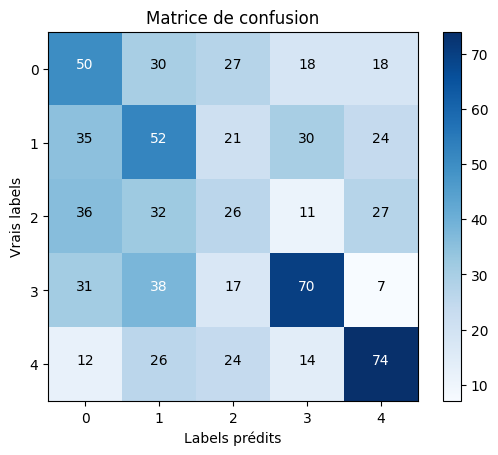

In [67]:
#Essayons avec model randomForest
from sklearn.ensemble import RandomForestClassifier
 
#Recherchons les meilleurs paramètres
from sklearn.model_selection import GridSearchCV
param_grid = {'n_estimators' : [50,100,200],
              'max_features' : ['auto','sqrt','log2'],
              'max_depth' : [4,5,6,7,8,10],
              'criterion' : ['gini','entropy']}
rfc = RandomForestClassifier(random_state=311)
model_forest_cv = GridSearchCV(estimator=rfc,param_grid=param_grid,cv=5,n_jobs=-1)
model_forest_cv.fit(X_train_pca,y_train)
 
display(model_forest_cv.best_params_)

#Creation de notre modèle avec les meilleurs paramètres
model_forest = RandomForestClassifier(random_state=311,
                                      n_estimators=model_forest_cv.best_params_['n_estimators'],
                                      max_depth=model_forest_cv.best_params_['max_depth'],
                                      max_features=model_forest_cv.best_params_['max_features'],
                                      criterion=model_forest_cv.best_params_['criterion'],
                                      n_jobs=-1,
                                      verbose=0)
model_forest.fit(X_train_pca,y_train)
print(f"Score sur les données réduites (Train) : ", model_forest.score(X_train_pca,y_train))
print(f"Score sur les données réduites (Test) : ", model_forest.score(X_test_pca,y_test))
 
#Prediction des données + classificatyion report
y_pred_forest = model_forest.predict(X_test_pca)
print(classification_report(y_test,y_pred_forest))
 
#Matrice de confusion
cnf_matrix_forest = confusion_matrix(y_test,y_pred_forest)
print_nice_conf_matrix(y_test,cnf_matrix_forest)

In [49]:
from keras.src.utils import np_utils
res_order_2 = res_order - 1
res_order_2 = np_utils.to_categorical(res_order_2,dtype='int')
images_array_CNN = np.array(images_array_base) / 255
display(images_array_CNN)
X_train, X_test, y_train, y_test = train_test_split(images_array_CNN, res_order_2, test_size=0.2, random_state=123)

pixel_number = X_train.shape[1]
display(pixel_number)

classe_number = y_test.shape[1]
display(classe_number)

array([[[0.41568627, 0.40784314, 0.30588235, ..., 0.25882353,
         0.37254902, 0.40392157],
        [0.41176471, 0.34117647, 0.18823529, ..., 0.2745098 ,
         0.36862745, 0.43529412],
        [0.28235294, 0.1372549 , 0.19215686, ..., 0.31764706,
         0.41960784, 0.40392157],
        ...,
        [0.14901961, 0.19215686, 0.21568627, ..., 0.41568627,
         0.40784314, 0.29411765],
        [0.18039216, 0.18431373, 0.20784314, ..., 0.24705882,
         0.31372549, 0.25490196],
        [0.18823529, 0.17254902, 0.23921569, ..., 0.18823529,
         0.09411765, 0.24705882]],

       [[0.04705882, 0.05098039, 0.05490196, ..., 0.0627451 ,
         0.05490196, 0.04313725],
        [0.05098039, 0.05490196, 0.05490196, ..., 0.0627451 ,
         0.0627451 , 0.05490196],
        [0.05882353, 0.05882353, 0.0627451 , ..., 0.05490196,
         0.05882353, 0.05490196],
        ...,
        [0.03529412, 0.03921569, 0.04313725, ..., 0.03921569,
         0.03921569, 0.03921569],
        [0.0

128

5

In [50]:
from keras.models import Sequential
from keras.src.layers import Dense,Dropout,Flatten
from keras.src.utils import np_utils
from keras.src.layers.convolutional import Conv2D,MaxPooling2D
from keras.optimizers import Adam

In [51]:
model_CNN = Sequential()
first_layer_CNN = Conv2D(filters=32,kernel_size=(5,5),padding='valid',input_shape=(128,128,1),activation='relu')
second_layer_CNN = MaxPooling2D(pool_size=(2,2))
third_layer_CNN = Dropout(rate=0.2)
forth_layer_CNN = Flatten()
fifth_layer_CNN = Dense(units=128,activation='relu')
last_layer_CNN = Dense(units=classe_number,activation='softmax')

model_CNN.add(first_layer_CNN)
model_CNN.add(second_layer_CNN)
model_CNN.add(third_layer_CNN)
model_CNN.add(forth_layer_CNN)
model_CNN.add(fifth_layer_CNN)
model_CNN.add(last_layer_CNN)

model_CNN.compile(optimizer=Adam(),loss='categorical_crossentropy',metrics=['accuracy'])

model_CNN.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 124, 124, 32)      832       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 62, 62, 32)        0         
 g2D)                                                            
                                                                 
 dropout_2 (Dropout)         (None, 62, 62, 32)        0         
                                                                 
 flatten_2 (Flatten)         (None, 123008)            0         
                                                                 
 dense_4 (Dense)             (None, 128)               15745152  
                                                                 
 dense_5 (Dense)             (None, 5)                 645       
                                                      

In [52]:
model_CNN2 = Sequential()
first_layer_CNN2 = Conv2D(filters=32,kernel_size=(5,5),padding='valid',input_shape=(128,128,1),activation='relu')
second_layer_CNN2 = MaxPooling2D(pool_size=(2,2))
third_layer_CNN2 = Conv2D(filters=16,kernel_size=(3,3),padding='valid',input_shape=(128,128,1),activation='relu')
forth_layer_CNN2 = MaxPooling2D(pool_size=(2,2))
fifth_layer_CNN2 = Dropout(rate=0.2)
sixth_layer_CNN2 = Flatten()
seventh_layer_CNN2 = Dense(units=128,activation='relu')
last_layer_CNN2 = Dense(units=classe_number,activation='softmax')

model_CNN2.add(first_layer_CNN2)
model_CNN2.add(second_layer_CNN2)
model_CNN2.add(third_layer_CNN2)
model_CNN2.add(forth_layer_CNN2)
model_CNN2.add(fifth_layer_CNN2)
model_CNN2.add(sixth_layer_CNN2)
model_CNN2.add(seventh_layer_CNN2)
model_CNN2.add(last_layer_CNN2)

model_CNN2.compile(optimizer=Adam(),loss='categorical_crossentropy',metrics=['accuracy'])

model_CNN2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 124, 124, 32)      832       
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 62, 62, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 30, 30, 16)        0         
 g2D)                                                            
                                                                 
 dropout_3 (Dropout)         (None, 30, 30, 16)        0         
                                                                 
 flatten_3 (Flatten)         (None, 14400)            

In [53]:
training_history = model_CNN.fit(x=X_train,y=y_train,epochs=10,batch_size=200,validation_split=0.2,verbose=1)

Epoch 1/10
32/32 [==============================] - 25s 735ms/step - loss: 3.3955 - accuracy: 0.2077 - val_loss: 1.6096 - val_accuracy: 0.2081
Epoch 2/10
32/32 [==============================] - 22s 700ms/step - loss: 1.6003 - accuracy: 0.2314 - val_loss: 1.5835 - val_accuracy: 0.2756
Epoch 3/10
32/32 [==============================] - 22s 697ms/step - loss: 1.5361 - accuracy: 0.2936 - val_loss: 1.5242 - val_accuracy: 0.2831
Epoch 4/10
32/32 [==============================] - 23s 712ms/step - loss: 1.4364 - accuracy: 0.3853 - val_loss: 1.4836 - val_accuracy: 0.3406
Epoch 5/10
32/32 [==============================] - 22s 700ms/step - loss: 1.2983 - accuracy: 0.4728 - val_loss: 1.4183 - val_accuracy: 0.3837
Epoch 6/10
32/32 [==============================] - 22s 689ms/step - loss: 1.1436 - accuracy: 0.5520 - val_loss: 1.3660 - val_accuracy: 0.4044
Epoch 7/10
32/32 [==============================] - 22s 685ms/step - loss: 0.9610 - accuracy: 0.6464 - val_loss: 1.3736 - val_accuracy: 0.4444

In [54]:
training_history2 = model_CNN2.fit(x=X_train,y=y_train,epochs=10,batch_size=200,validation_split=0.2,verbose=1)

Epoch 1/10
32/32 [==============================] - 20s 571ms/step - loss: 1.5566 - accuracy: 0.3013 - val_loss: 1.5041 - val_accuracy: 0.3400
Epoch 2/10
32/32 [==============================] - 17s 537ms/step - loss: 1.4086 - accuracy: 0.4080 - val_loss: 1.4038 - val_accuracy: 0.3994
Epoch 3/10
32/32 [==============================] - 18s 548ms/step - loss: 1.2999 - accuracy: 0.4672 - val_loss: 1.3785 - val_accuracy: 0.4050
Epoch 4/10
32/32 [==============================] - 17s 511ms/step - loss: 1.1802 - accuracy: 0.5336 - val_loss: 1.3158 - val_accuracy: 0.4569
Epoch 5/10
32/32 [==============================] - 16s 499ms/step - loss: 1.0801 - accuracy: 0.5689 - val_loss: 1.3412 - val_accuracy: 0.4425
Epoch 6/10
32/32 [==============================] - 16s 490ms/step - loss: 0.9889 - accuracy: 0.6192 - val_loss: 1.3297 - val_accuracy: 0.4581
Epoch 7/10
32/32 [==============================] - 16s 493ms/step - loss: 0.8981 - accuracy: 0.6589 - val_loss: 1.3538 - val_accuracy: 0.4619

In [55]:
def analyze_model(model,X_test,y_test,train_hist,epochs_nb=20) :
    score = model.evaluate(X_test,y_test)
    erreur = 1 - score[1]
    new_ligne = '\n'
    display(f"Valeur de la perte sur le set de test : {score[0]}")
    display(f"Erreur du modèle sur le set de test : {erreur}")
    train_acc = train_hist.history['accuracy']
    val_acc = train_hist.history['val_accuracy']
    epo = epochs_nb + 1
    plt.figure(figsize=(16,8))
    plt.plot(train_acc)
    plt.plot(val_acc)
    plt.title("Accuracy en fonction des epochs")
    plt.legend(["Training set model","validation set model"])
    plt.xlim((0,epochs_nb));

63/63 [==============================] - 2s 27ms/step - loss: 1.4992 - accuracy: 0.4300


'Valeur de la perte sur le set de test : 1.4991520643234253'

'Erreur du modèle sur le set de test : 0.5699999928474426'

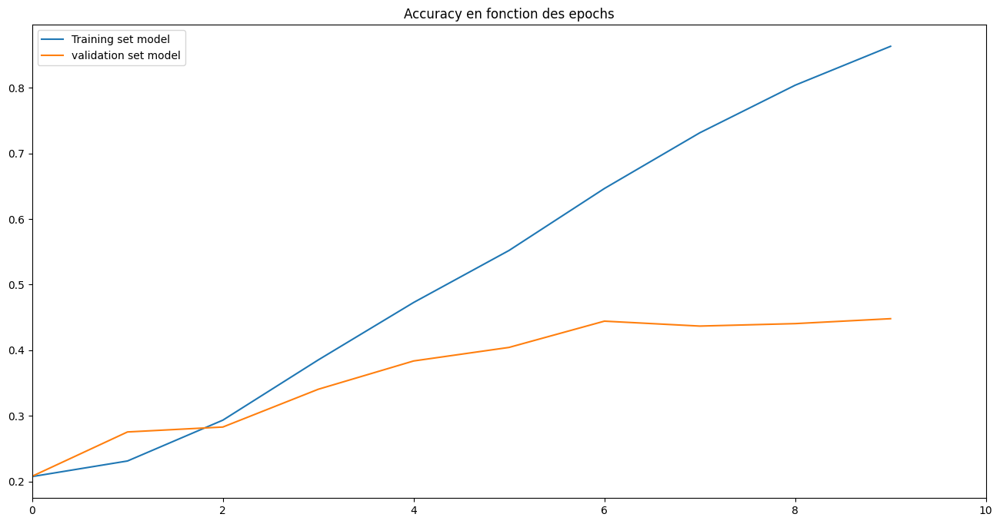

In [56]:
analyze_model(model_CNN,X_test,y_test,training_history,10)

63/63 [==============================] - 2s 25ms/step - loss: 1.4916 - accuracy: 0.4525


'Valeur de la perte sur le set de test : 1.491554856300354'

'Erreur du modèle sur le set de test : 0.5475000143051147'

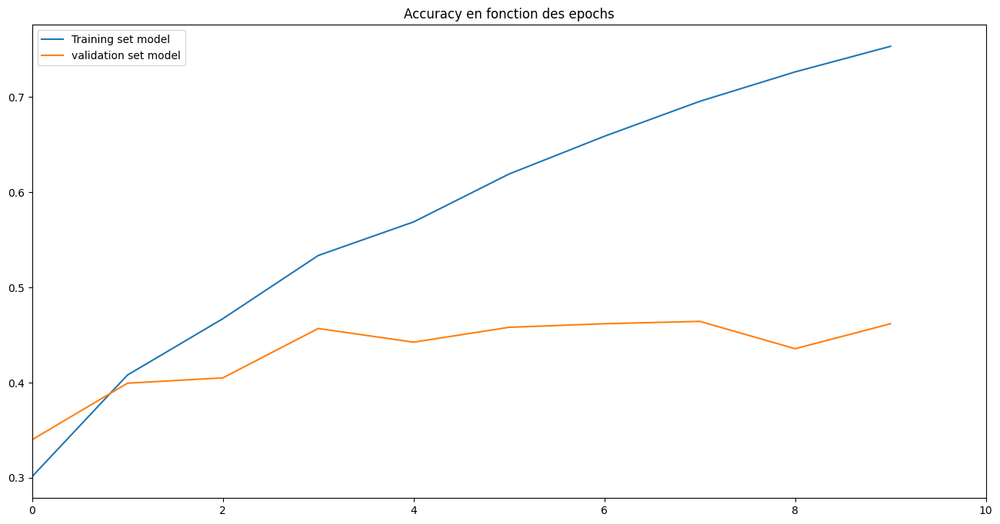

In [57]:
analyze_model(model_CNN2,X_test,y_test,training_history2,10)

In [58]:
from sklearn.metrics import classification_report
proba_class_test = model_CNN.predict(X_test)
predict_class_test = proba_class_test.argmax(axis=1)
y_test_class = y_test.argmax(axis=1)
print(classification_report(y_test_class, predict_class_test))

63/63 [==============================] - 2s 29ms/step
              precision    recall  f1-score   support

           0       0.37      0.37      0.37       413
           1       0.33      0.20      0.25       391
           2       0.41      0.32      0.36       405
           3       0.47      0.43      0.45       404
           4       0.49      0.84      0.62       387

    accuracy                           0.43      2000
   macro avg       0.41      0.43      0.41      2000
weighted avg       0.41      0.43      0.41      2000



In [59]:
from sklearn.metrics import classification_report
proba_class_test2 = model_CNN2.predict(X_test)
predict_class_test2 = proba_class_test2.argmax(axis=1)
y_test_class2 = y_test.argmax(axis=1)
print(classification_report(y_test_class2, predict_class_test2))

63/63 [==============================] - 2s 27ms/step
              precision    recall  f1-score   support

           0       0.43      0.33      0.38       413
           1       0.33      0.39      0.36       391
           2       0.35      0.46      0.40       405
           3       0.55      0.43      0.48       404
           4       0.69      0.65      0.67       387

    accuracy                           0.45      2000
   macro avg       0.47      0.45      0.46      2000
weighted avg       0.47      0.45      0.46      2000



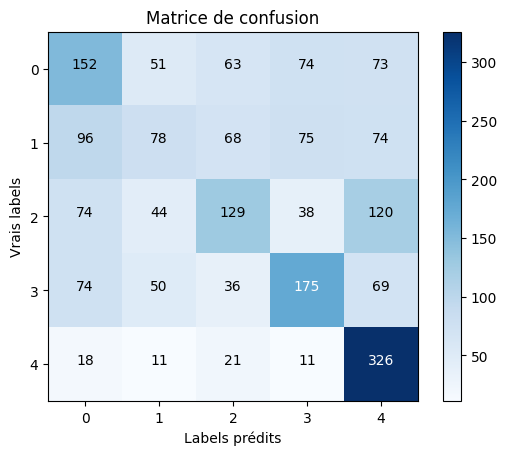

In [60]:
from sklearn.metrics import confusion_matrix
conf_matrix1 = confusion_matrix(y_test_class, predict_class_test)
print_nice_conf_matrix(y_test_class,conf_matrix1)

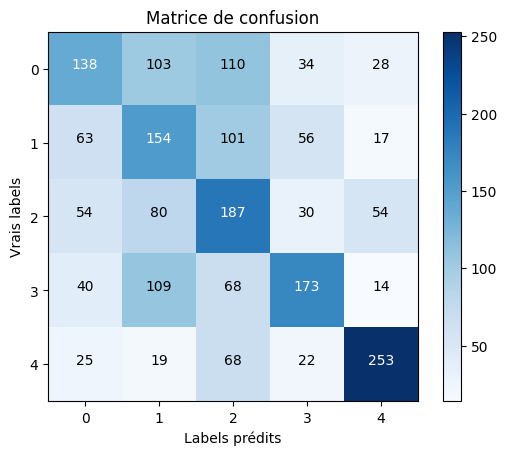

In [61]:
conf_matrix2 = confusion_matrix(y_test_class2, predict_class_test2)
print_nice_conf_matrix(y_test_class2,conf_matrix2)